<a href="https://colab.research.google.com/github/Ranjakasa/Ranjakasa-Real---time-Face-Mask-Detection/blob/main/Real_time_Face_Mask_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [11]:
! pip install kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [12]:

# configuring the path of Kaggle.json file
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

Importing Face Mask Dataset


In [13]:
# API to fetch the dataset from Kaggle
!kaggle datasets download -d omkargurav/face-mask-dataset

 98% 160M/163M [00:00<00:00, 246MB/s]
100% 163M/163M [00:00<00:00, 232MB/s]


In [14]:
# extracting the compessed Dataset
from zipfile import ZipFile
dataset = '/content/face-mask-dataset.zip'

with ZipFile(dataset,'r') as zip:
  zip.extractall()
  print('The dataset is extracted')

The dataset is extracted


In [15]:
!ls

data  face-mask-dataset.zip  kaggle.json  sample_data


Importing the Dependencies

In [16]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
from google.colab.patches import cv2_imshow
from PIL import Image 
from sklearn.model_selection import train_test_split

In [17]:
with_mask_files = os.listdir('/content/data/with_mask')
print(with_mask_files[0:5])
print(with_mask_files[-5:])

['with_mask_3566.jpg', 'with_mask_2736.jpg', 'with_mask_1125.jpg', 'with_mask_3216.jpg', 'with_mask_2850.jpg']
['with_mask_2573.jpg', 'with_mask_2140.jpg', 'with_mask_3667.jpg', 'with_mask_208.jpg', 'with_mask_3684.jpg']


In [18]:
without_mask_files = os.listdir('/content/data/without_mask')
print(without_mask_files[0:5])
print(without_mask_files[-5:])

['without_mask_393.jpg', 'without_mask_47.jpg', 'without_mask_2729.jpg', 'without_mask_1834.jpg', 'without_mask_2916.jpg']
['without_mask_2094.jpg', 'without_mask_1989.jpg', 'without_mask_2304.jpg', 'without_mask_1507.jpg', 'without_mask_3115.jpg']


In [19]:
print('Number of with mask images:', len(with_mask_files))
print('Number of without mask images:', len(without_mask_files))

Number of with mask images: 3725
Number of without mask images: 3828


Creating Labels for the two class of Images

with mask --> 1

without mask --> 0

In [20]:
# create the labels

with_mask_labels = [1]*3725

without_mask_labels = [0]*3828

In [21]:
print(with_mask_labels[0:5])

print(without_mask_labels[0:5])

[1, 1, 1, 1, 1]
[0, 0, 0, 0, 0]


In [22]:
print(len(with_mask_labels))
print(len(without_mask_labels))

3725
3828


In [23]:
labels = with_mask_labels + without_mask_labels

print(len(labels))
print(labels[0:5])
print(labels[-5:])

7553
[1, 1, 1, 1, 1]
[0, 0, 0, 0, 0]


Displaying the Images

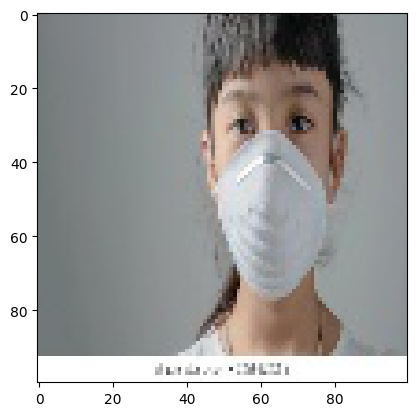

In [25]:
# displaying with mask image
img = mpimg.imread('/content/data/with_mask/with_mask_3566.jpg')
imgplot = plt.imshow(img)
plt.show()

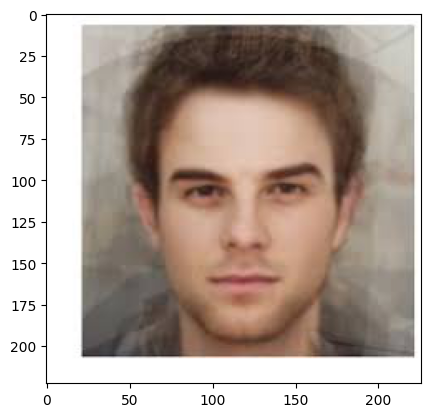

In [26]:
# displaying without mask image
img = mpimg.imread('/content/data/without_mask/without_mask_2094.jpg')
imgplot = plt.imshow(img)
plt.show()

Image Processing

Resize the Images

Convert the images to numpy arrays

In [27]:
# convert images to numpy arrays+

with_mask_path = '/content/data/with_mask/'

data = []

for img_file in with_mask_files:

  image = Image.open(with_mask_path + img_file)
  image = image.resize((128,128))
  image = image.convert('RGB')
  image = np.array(image)
  data.append(image)



without_mask_path = '/content/data/without_mask/'


for img_file in without_mask_files:

  image = Image.open(without_mask_path + img_file)
  image = image.resize((128,128))
  image = image.convert('RGB')
  image = np.array(image)
  data.append(image)

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:975: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [28]:
type(data)

list

In [29]:
len(data)

7553

In [30]:
data[0]

array([[[118, 122, 125],
        [119, 123, 126],
        [119, 123, 126],
        ...,
        [140, 150, 152],
        [140, 150, 152],
        [139, 149, 151]],

       [[118, 122, 125],
        [118, 122, 125],
        [118, 122, 125],
        ...,
        [140, 150, 152],
        [140, 150, 152],
        [139, 149, 151]],

       [[118, 122, 125],
        [118, 122, 125],
        [118, 122, 125],
        ...,
        [140, 150, 152],
        [140, 150, 152],
        [139, 149, 151]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]

In [31]:
type(data[0])

numpy.ndarray

In [32]:
data[0].shape

(128, 128, 3)

In [33]:
# converting image list and label list to numpy arrays

X = np.array(data)
Y = np.array(labels)

In [34]:
type(X)

numpy.ndarray

In [35]:
type(Y)

numpy.ndarray

In [36]:
print(X.shape)
print(Y.shape)

(7553, 128, 128, 3)
(7553,)


In [37]:
print(Y)

[1 1 1 ... 0 0 0]


Train Test Split

In [38]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=2)

In [39]:
print(X.shape, X_train.shape, X_test.shape)

(7553, 128, 128, 3) (6042, 128, 128, 3) (1511, 128, 128, 3)


In [40]:
# scaling the data

X_train_scaled = X_train/255

X_test_scaled = X_test/255

In [41]:
X_train[0]

array([[[120,  90,  69],
        [103,  72,  50],
        [107,  76,  54],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[114,  84,  60],
        [103,  73,  49],
        [110,  79,  56],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[115,  85,  61],
        [110,  80,  56],
        [110,  79,  56],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[253, 253, 253],
        [254, 254, 254],
        [255, 255, 255],
        ...,
        [ 27,  35,  60],
        [ 25,  33,  70],
        [ 24,  33,  66]],

       [[253, 253, 253],
        [254, 254, 254],
        [255, 255, 255],
        ...,
        [ 27,  35,  61],
        [ 25,  33,  70],
        [ 24,  33,  66]],

       [[253, 253, 253],
        [254, 254, 254],
        [255, 255, 255],
        ...,
        [ 27,  35,  61],
        [ 25,  33,  70],
        [ 24,  33,  66]]

In [42]:
X_train_scaled[0]

array([[[0.47058824, 0.35294118, 0.27058824],
        [0.40392157, 0.28235294, 0.19607843],
        [0.41960784, 0.29803922, 0.21176471],
        ...,
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ]],

       [[0.44705882, 0.32941176, 0.23529412],
        [0.40392157, 0.28627451, 0.19215686],
        [0.43137255, 0.30980392, 0.21960784],
        ...,
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ]],

       [[0.45098039, 0.33333333, 0.23921569],
        [0.43137255, 0.31372549, 0.21960784],
        [0.43137255, 0.30980392, 0.21960784],
        ...,
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ]],

       ...,

       [[0.99215686, 0.99215686, 0.99215686],
        [0.99607843, 0.99607843, 0.99607843],
        [1.        , 1

Building a Convolutional Neural Network(CNN)

In [43]:
import tensorflow as tf
from tensorflow import keras

In [44]:
num_of_classes = 2

model = keras.Sequential()

model.add(keras.layers.Conv2D(32, kernel_size=(3,3), activation='relu', input_shape=(128,128,3)))
model.add(keras.layers.MaxPooling2D(pool_size=(2,2)))


model.add(keras.layers.Conv2D(64, kernel_size=(3,3), activation='relu'))
model.add(keras.layers.MaxPooling2D(pool_size=(2,2)))

model.add(keras.layers.Flatten())

model.add(keras.layers.Dense(128, activation='relu'))
model.add(keras.layers.Dropout(0.5))

model.add(keras.layers.Dense(64, activation='relu'))
model.add(keras.layers.Dropout(0.5))


model.add(keras.layers.Dense(num_of_classes, activation='sigmoid'))

In [45]:
# compile the neural network
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['acc'])

In [46]:
# training the neural network
history = model.fit(X_train_scaled, Y_train, validation_split=0.1, epochs=5)

Epoch 1/5
170/170 [==============================] - 15s 24ms/step - loss: 0.5772 - acc: 0.7394 - val_loss: 0.3925 - val_acc: 0.8264
Epoch 2/5
170/170 [==============================] - 3s 19ms/step - loss: 0.3343 - acc: 0.8628 - val_loss: 0.2675 - val_acc: 0.8942
Epoch 3/5
170/170 [==============================] - 3s 18ms/step - loss: 0.2794 - acc: 0.8856 - val_loss: 0.2503 - val_acc: 0.8992
Epoch 4/5
170/170 [==============================] - 3s 20ms/step - loss: 0.2572 - acc: 0.8942 - val_loss: 0.2291 - val_acc: 0.9174
Epoch 5/5
170/170 [==============================] - 4s 23ms/step - loss: 0.2317 - acc: 0.9049 - val_loss: 0.2177 - val_acc: 0.9240


Model Evaluation

In [47]:
loss, accuracy = model.evaluate(X_test_scaled, Y_test)
print('Test Accuracy =', accuracy)

48/48 [==============================] - 1s 15ms/step - loss: 0.2181 - acc: 0.9226
Test Accuracy = 0.9225678443908691


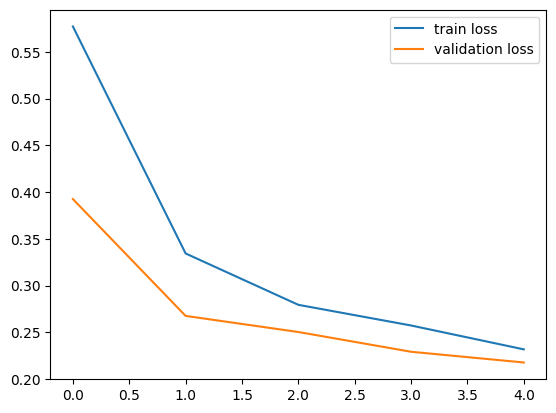

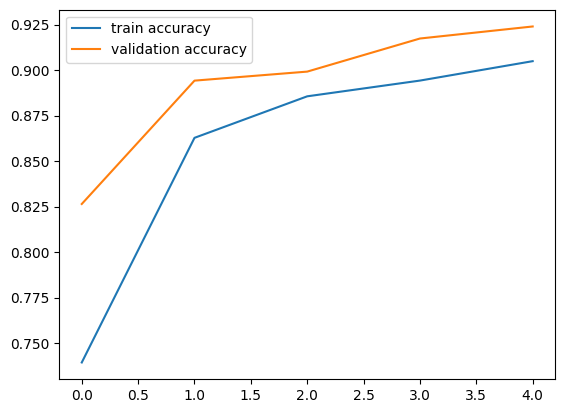

In [48]:
h = history

# plot the loss value
plt.plot(h.history['loss'], label='train loss')
plt.plot(h.history['val_loss'], label='validation loss')
plt.legend()
plt.show()

# plot the accuracy value
plt.plot(h.history['acc'], label='train accuracy')
plt.plot(h.history['val_acc'], label='validation accuracy')
plt.legend()
plt.show()

Predictive System

Path of the image to be predicted: /content/with_mask_20.jpg


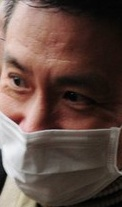

1/1 [==============================] - 0s 174ms/step
[[0.48458162 0.56267035]]
1
The person in the image is wearing a mask


In [49]:
input_image_path = input('Path of the image to be predicted: ')

input_image = cv2.imread(input_image_path)

cv2_imshow(input_image)

input_image_resized = cv2.resize(input_image, (128,128))

input_image_scaled = input_image_resized/255

input_image_reshaped = np.reshape(input_image_scaled, [1,128,128,3])

input_prediction = model.predict(input_image_reshaped)

print(input_prediction)


input_pred_label = np.argmax(input_prediction)

print(input_pred_label)


if input_pred_label == 1:

  print('The person in the image is wearing a mask')

else:

  print('The person in the image is not wearing a mask')

Path of the image to be predicted: /content/pexels-italo-melo-2379004.jpg


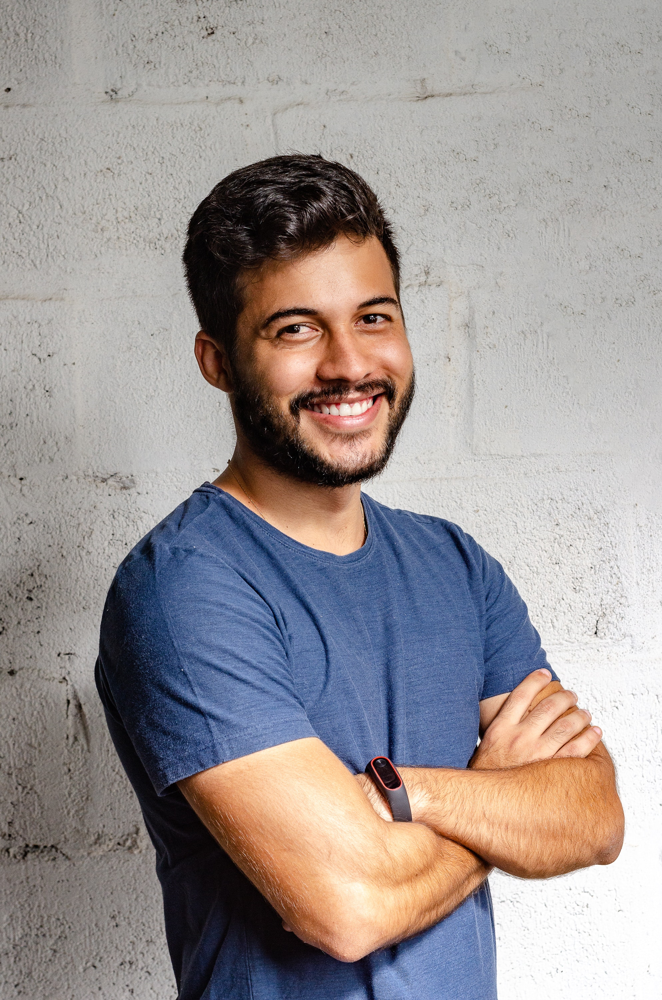

1/1 [==============================] - 0s 26ms/step
[[0.5469423  0.49016047]]
0
The person in the image is not wearing a mask


In [53]:
input_image_path = input('Path of the image to be predicted: ')

input_image = cv2.imread(input_image_path)

cv2_imshow(input_image)

input_image_resized = cv2.resize(input_image, (128,128))

input_image_scaled = input_image_resized/255

input_image_reshaped = np.reshape(input_image_scaled, [1,128,128,3])

input_prediction = model.predict(input_image_reshaped)

print(input_prediction)


input_pred_label = np.argmax(input_prediction)

print(input_pred_label)


if input_pred_label == 1:

  print('The person in the image is wearing a mask')

else:

  print('The person in the image is not wearing a mask')